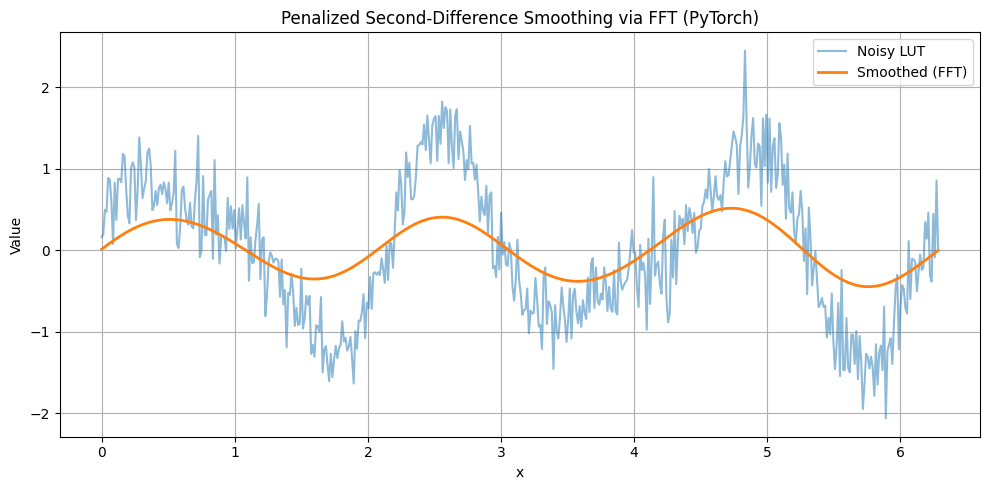

In [11]:
# Re-import necessary libraries after kernel reset
import torch
import matplotlib.pyplot as plt

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Parameters
n = 512
h = 1.0
λ = 1e6

# Create uniform grid
x = torch.linspace(0, 2 * torch.pi, n, device=device)

# Create noisy signal
torch.manual_seed(0)
clean = torch.sin(3 * x) + 0.5 * torch.cos(5 * x)
noise = 0.3 * torch.randn(n, device=device)
y = clean + noise

# Build convolution kernel: [λ, -4λ, 1+6λ, -4λ, λ]
kernel = torch.tensor(
    [λ, -4 * λ, 1 + 6 * λ, -4 * λ, λ], device=device, dtype=torch.float32
)
k_len = kernel.shape[0]

# Pad the kernel from index 0 (no centering/rolling)
a_padded = torch.zeros(n, device=device)
a_padded[:k_len] = kernel

# Perform FFT-based inverse filtering (circular smoothing)
A_freq = torch.fft.fft(a_padded)
Y_freq = torch.fft.fft(y)
Z_freq = Y_freq / A_freq
z_smooth = torch.fft.ifft(Z_freq).real

# Move to CPU for plotting
x_cpu = x.cpu().numpy()
y_cpu = y.cpu().numpy()
z_cpu = z_smooth.cpu().numpy()

# Plot result
plt.figure(figsize=(10, 5))
plt.plot(x_cpu, y_cpu, label="Noisy LUT", alpha=0.5)
plt.plot(x_cpu, z_cpu, label="Smoothed (FFT)", linewidth=2)
plt.title("Penalized Second-Difference Smoothing via FFT (PyTorch)")
plt.xlabel("x")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



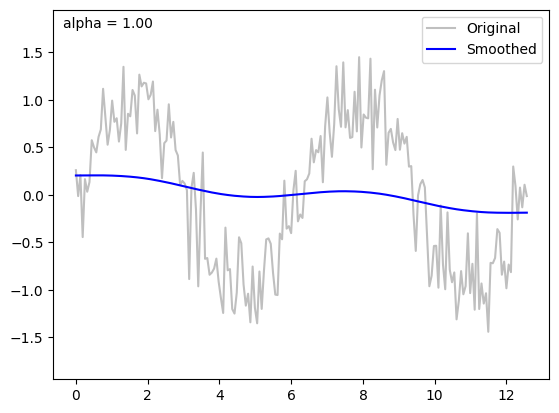

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from scipy.fftpack import dct, idct

# --- 1. Smoothing function ---
def smooth_dct(signal, alpha=0.1):
    n = len(signal)
    coeffs = dct(signal, type=2, norm='ortho')
    freqs = np.arange(n)
    attenuation = 1 / (1 + (alpha * freqs)**2)
    coeffs_filtered = coeffs * attenuation
    return idct(coeffs_filtered, type=2, norm='ortho')

# --- 2. Generate noisy signal ---
x = np.linspace(0, 4*np.pi, 200)
y = np.sin(x) + 0.3 * np.random.randn(len(x))

# --- 3. Setup the plot ---
fig, ax = plt.subplots()
line_raw, = ax.plot(x, y, label='Original', color='gray', alpha=0.5)
line_smooth, = ax.plot([], [], label='Smoothed', color='blue')
text = ax.text(0.02, 0.95, '', transform=ax.transAxes)
ax.set_ylim(y.min() - 0.5, y.max() + 0.5)
ax.legend()

# --- 4. Animation function ---
alphas = np.linspace(0, 1.0, 60)

def update(frame):
    alpha = alphas[frame]
    y_smooth = smooth_dct(y, alpha)
    line_smooth.set_data(x, y_smooth)
    text.set_text(f'alpha = {alpha:.2f}')
    return line_smooth, text

# --- 5. Create and save the GIF ---
ani = FuncAnimation(fig, update, frames=len(alphas), blit=True)
ani.save("dct_smoothing.gif", writer=PillowWriter(fps=20))


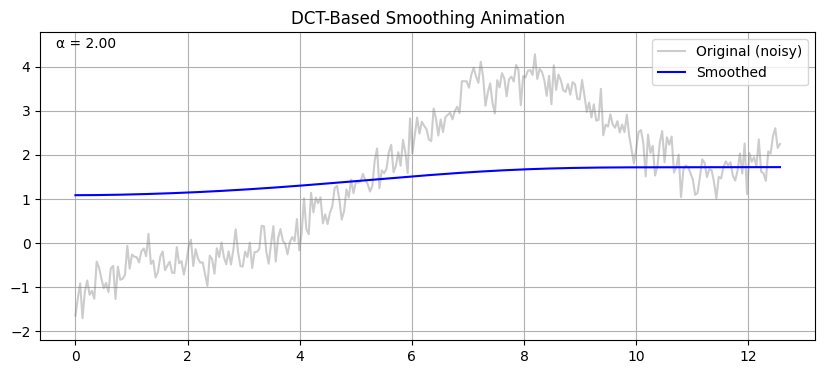

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.fftpack import dct, idct
from IPython.display import HTML

# --- 1. DCT smoothing function ---
def smooth_dct(signal, alpha):
    n = len(signal)
    coeffs = dct(signal, type=2, norm='ortho')
    freqs = np.arange(n)
    attenuation = 1 / (1 + (alpha * freqs)**2)
    coeffs_filtered = coeffs * attenuation
    return idct(coeffs_filtered, type=2, norm='ortho')

# --- 2. Generate noisy signal ---
x = np.linspace(0, 4*np.pi, 300)
y = np.sin(x) + 0.3 * np.random.randn(len(x)) + 0.1 * x + np.tanh(x - 3) + (x - 2)**2 / 100 - (x-5)**3 / 200 + np.sin(np.tanh(x - 4))

# --- 3. Setup figure ---
fig, ax = plt.subplots(figsize=(10, 4))
line_raw, = ax.plot(x, y, label='Original (noisy)', alpha=0.4, color='gray')
line_smooth, = ax.plot([], [], label='Smoothed', color='blue')
text = ax.text(0.02, 0.95, '', transform=ax.transAxes)
ax.set_ylim(y.min() - 0.5, y.max() + 0.5)
ax.set_title("DCT-Based Smoothing Animation")
ax.legend()
ax.grid(True)

# --- 4. Update function ---
alphas = np.linspace(0, 2.0, 250)

def update(frame):
    alpha = alphas[frame]
    y_smooth = smooth_dct(y, alpha)
    line_smooth.set_data(x, y_smooth)
    text.set_text(f"α = {alpha:.2f}")
    return line_smooth, text

# --- 5. Create animation ---
ani = FuncAnimation(fig, update, frames=len(alphas), blit=True, interval=50)

# --- 6. Display inline video in notebook ---
HTML(ani.to_jshtml())


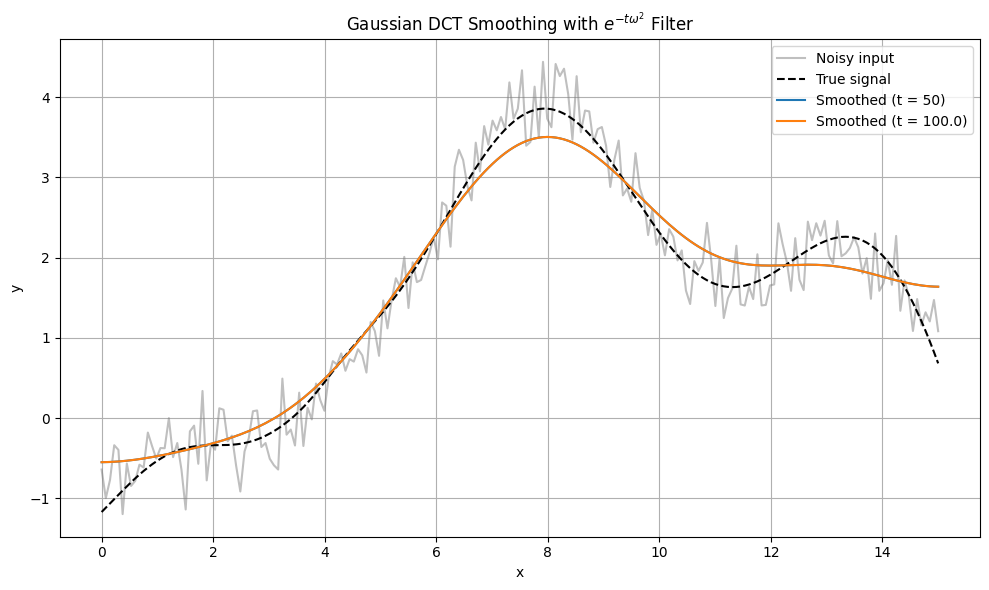

[array([-0.55024257, -0.54933908, -0.54753965, -0.54485918, -0.54131958,
       -0.53694924, -0.53178231, -0.52585793, -0.51921921, -0.51191222,
       -0.50398486, -0.49548564, -0.4864625 , -0.47696155, -0.46702595,
       -0.45669469, -0.44600158, -0.43497422, -0.42363321, -0.41199135,
       -0.40005309, -0.38781412, -0.37526108, -0.36237147, -0.34911378,
       -0.33544766, -0.32132444, -0.30668761, -0.29147362, -0.27561265,
       -0.25902966, -0.24164538, -0.22337747, -0.20414167, -0.18385303,
       -0.16242708, -0.139781  , -0.11583475, -0.09051207, -0.0637415 ,
       -0.03545711, -0.0055993 ,  0.02588469,  0.05904036,  0.09390566,
        0.13051089,  0.16887868,  0.20902419,  0.25095533,  0.29467314,
        0.34017222,  0.38744121,  0.43646334,  0.48721693,  0.53967593,
        0.59381037,  0.64958678,  0.70696852,  0.76591604,  0.82638702,
        0.88833638,  0.95171622,  1.01647563,  1.08256042,  1.14991271,
        1.21847047,  1.28816702,  1.35893048,  1.43068314,  1.5

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import dct, idct

def gaussian_dct_smooth(y, t):
    """
    Applies Gaussian smoothing in the DCT domain.
    Parameters:
        y : ndarray
            1D input signal
        t : float
            Smoothing strength; larger t means more smoothing
    Returns:
        Smoothed signal (same length as y)
    """
    n = len(y)
    y_dct = dct(y, norm='ortho')
    k = np.arange(n)
    omega = 2 * np.sin(np.pi * k / (2 * n))  # DCT-II frequencies
    g = np.exp(-t * omega**2)
    y_smooth = idct(y_dct * g, norm='ortho')
    return y_smooth

# --- Example signal: piecewise + noise
np.random.seed(0)
n = 200
x = np.linspace(0, 15, n)
# y_true = np.piecewise(x, [x < 0.3, (x >= 0.3) & (x < 0.7), x >= 0.7],
#                       [lambda x: x*2, lambda x: 0.6 + 0*x, lambda x: 2-2*x])
y_true = np.sin(x) + 0.1 * x + np.tanh(x - 3) + (x - 2)**2 / 100 - (x-5)**3 / 200 + np.sin(np.tanh(x - 4))

y_noisy = y_true + 0.3 * np.random.randn(n)

# --- Apply smoothing with different t
# t_values = [50, 100.0]
smoothed_curves = [gaussian_dct_smooth(gaussian_dct_smooth(y_noisy, 50), 50), gaussian_dct_smooth(y_noisy, 100.0)]

# --- Plot
plt.figure(figsize=(10, 6))
plt.plot(x, y_noisy, label="Noisy input", color='gray', alpha=0.5)
plt.plot(x, y_true, label="True signal", color='black', linestyle='--')
for t, y_smooth in zip(t_values, smoothed_curves):
    plt.plot(x, y_smooth, label=f"Smoothed (t = {t})")

plt.title("Gaussian DCT Smoothing with $e^{-t\\omega^2}$ Filter")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(smoothed_curves)


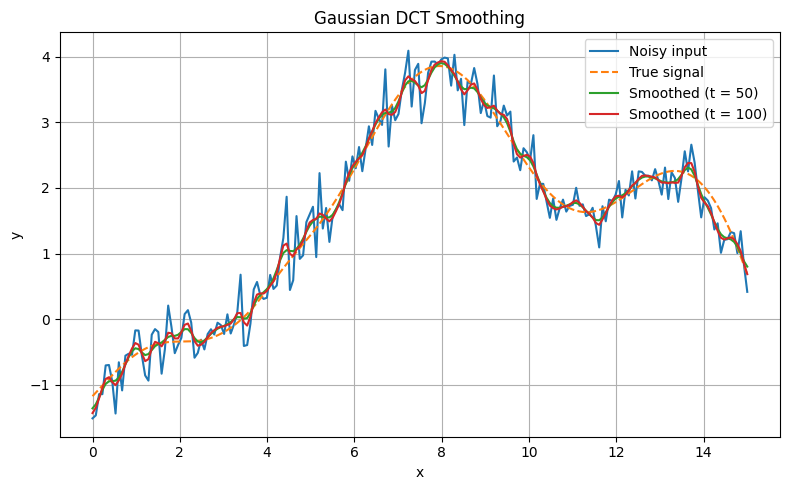

In [2]:
import torch
import math
import torch_dct as dct
import matplotlib.pyplot as plt

def gaussian_dct_smooth_torch(y, t):
    """
    Applies Gaussian smoothing in the DCT domain using PyTorch.
    Parameters:
        y : Tensor of shape (n,)
            Input signal.
        t : float
            Smoothing strength; larger t means more smoothing.
    Returns:
        Tensor of shape (n,): smoothed signal.
    """
    y = y.to(dtype=torch.float32)
    n = y.shape[-1]
    y_dct = dct.dct(y, norm='ortho')
    k = torch.arange(n, device=y.device, dtype=y.dtype)
    omega = 2 * torch.sin(math.pi * k / (2 * n))
    g = torch.exp(-t * omega**2)
    return dct.idct(y_dct * g, norm='ortho')

# Generate example signal
torch.manual_seed(0)
n = 200
x = torch.linspace(0, 15, n)
y_true = (torch.sin(x) + 0.1 * x +
          torch.tanh(x - 3) +
          (x - 2)**2 / 100 -
          (x - 5)**3 / 200 +
          torch.sin(torch.tanh(x - 4)))
y_noisy = y_true + 0.3 * torch.randn(n)

# Apply smoothing with two different t values
y_smooth1 = gaussian_dct_smooth_torch(gaussian_dct_smooth_torch(y_noisy, t=1.0), t=1.0)
y_smooth2 = gaussian_dct_smooth_torch(y_noisy, t=1.0)

# Convert to numpy for plotting
x_np = x.numpy()
y_noisy_np = y_noisy.numpy()
y_true_np = y_true.numpy()
y_smooth1_np = y_smooth1.numpy()
y_smooth2_np = y_smooth2.numpy()

# Plotting
plt.figure(figsize=(8, 5))
plt.plot(x_np, y_noisy_np, label="Noisy input")
plt.plot(x_np, y_true_np, linestyle='--', label="True signal")
plt.plot(x_np, y_smooth1_np, label="Smoothed (t = 50)")
plt.plot(x_np, y_smooth2_np, label="Smoothed (t = 100)")
plt.title("Gaussian DCT Smoothing")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


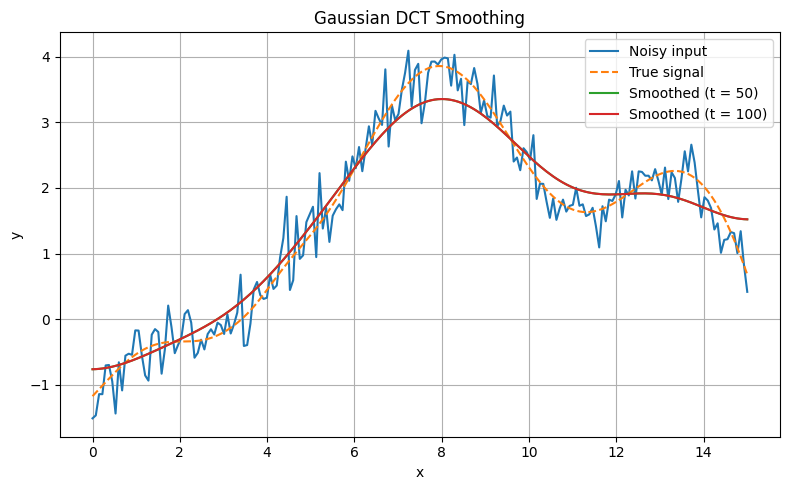

In [20]:
# Plotting
plt.figure(figsize=(8, 5))
plt.plot(x_np, y_noisy_np, label="Noisy input")
plt.plot(x_np, y_true_np, linestyle='--', label="True signal")
plt.plot(x_np, y_smooth1_np, label="Smoothed (t = 50)")
plt.plot(x_np, y_smooth2_np, label="Smoothed (t = 100)")
plt.title("Gaussian DCT Smoothing")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
